# **Full Corpus Sentiment Analysis**

## **DS 5001: Exploratory Text Analytics**

## **Cecily Wolfe (cew4pf)**

## **Spring 2022**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from IPython.display import display, HTML

import nltk
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.lancaster import LancasterStemmer

from bow_tfidf_pca import create_bow, get_tfidf, get_pca

import itertools

In [2]:
sns.set()

In [3]:
OHCO = ['book_id', 'chap_id', 'para_num', 'sent_num', 'token_num']
emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()

In [4]:
SENTS = OHCO[:4]
PARAS = OHCO[:3]
CHAPS = OHCO[:2]
BOOKS = OHCO[:1]

## **Get Data**

In [5]:
# read in csv files

dickens_LIB = pd.read_csv('dickens_pre_LIB.csv')

dickens_CORPUS = pd.read_csv('dickens_pre_CORPUS.csv')

twain_LIB = pd.read_csv('twain_pre_LIB.csv')

twain_CORPUS = pd.read_csv('twain_pre_CORPUS.csv')

### **`LIB` Table**

In [6]:
# combined LIB
LIB = pd.concat([dickens_LIB, twain_LIB]).set_index(BOOKS).sort_index()

In [7]:
LIB['label'] = LIB.apply(lambda x: "{}_{}_{}".format(x.author, x.title.replace(' ', '_'), x.name), 1)

In [8]:
LIB

,source_file_path,title,chap_regex,author,type,year,decade,n_chaps,book_len,label
book_id,,,,,,,,,,
70,Twain/70-what_is_man.txt,what is man,WHAT IS MAN?|THE DEATH OF JEAN|THE TURNING-POI...,twain,non-fiction,1906,1900,17,96111,twain_what_is_man_70
74,Twain/74-the_adventures_of_tom_sawyer.txt,the adventures of tom sawyer,^\s*CHAPTER\s*[IVXLCM]+$,twain,novel,1876,1870,35,70276,twain_the_adventures_of_tom_sawyer_74
76,Twain/76-the_adventures_of_huckleberry_finn.txt,the adventures of huckleberry finn,^\s*CHAPTER\s*(?:[IVXLCM]+\.|THE LAST)$,twain,novel,1884,1880,43,111908,twain_the_adventures_of_huckleberry_finn_76
86,Twain/86-a_connecticut_yankee_in_king_arthurs_...,a connecticut yankee in king arthurs court,^\s*(?:PREFACE|A WORD OF EXPLANATION|THE STRAN...,twain,novel,1889,1880,47,119100,twain_a_connecticut_yankee_in_king_arthurs_cou...
91,Twain/91-tom_sawyer_abroad.txt,tom sawyer abroad,CHAPTER\s[IVXLCM]+\.,twain,novel,1894,1890,13,33969,twain_tom_sawyer_abroad_91
...,...,...,...,...,...,...,...,...,...,...
35536,Dickens/35536-the_poems_and_verses_of_charles_...,the poems and verses of charles dickens,THE VILLAGE COQUETTES$|THE LAMPLIGHTER$|SONGS ...,dickens,stories,1885,1880,13,10952,dickens_the_poems_and_verses_of_charles_dicken...
60900,Twain/60900-merry_tales.txt,merry tales,^THE PRIVATE HISTORY OF A CAMPAIGN THAT FAILED...,twain,stories,1892,1890,6,36846,twain_merry_tales_60900
61522,Twain/61522-the_1000000_bank_note.txt,the 1000000 bank note,"^_THE £1,000,000 BANK-NOTE_$|^_METNAL TELEGRAP...",twain,stories,1893,1890,6,65207,twain_the_1000000_bank_note_61522


### **`CORPUS` Table**

In [9]:
# combined corpus

CORPUS = pd.concat([dickens_CORPUS, twain_CORPUS]).set_index(OHCO) 

# remove NaN values
CORPUS = CORPUS[~CORPUS.term_str.isna()]

In [10]:
CORPUS

pos_tuple  pos  \
book_id chap_id para_num sent_num token_num                               
98      1       0        0        0                  ('The', 'DT')   DT   
                                  1               ('Period', 'NN')   NN   
                1        0        0                  ('It', 'PRP')  PRP   
                                  1                 ('was', 'VBD')  VBD   
                                  2                  ('the', 'DT')   DT   
...                                                            ...  ...   
62739   6       13       0        8           ("Leopold's", 'NNP')  NNP   
                                  9          ('Soliloquy,', 'NNP')  NNP   
                                  10                  ('by', 'IN')   IN   
                                  11               ('Mark', 'NNP')  NNP   
                                  12              ('Twain', 'NNP')  NNP   

                                              token_str   term_str  
book_id chap_id para_num sent_num token_num                         
98      1       0        0        0                 The        the  
                                  1              Period     period  
                1        0        0                  It         it  
                                  1                 was        was  
                                  2                 the        the  
...                                                 ...        ...  
62739   6       13       0        8           Leopold's   leopolds  
                                  9          Soliloquy,  soliloquy  
                                  10                 by         by  
                                  11               Mark       mark  
                                  12              Twain      twain  

[7940320 rows x 4 columns]

### **`VOCAB` Table**

In [11]:
VOCAB = pd.read_csv('full_VOCAB.csv').set_index('term_str')

In [12]:
VOCAB.head()

,term_rank,n,n_chars,p,i,max_pos,n_pos,cat_pos,stop,stem_porter,stem_snowball,stem_lancaster,term_rank2,zipf_k,zipf_k2,tfidf_mean_chap_max,tfidf_max_chap_max,df,idf,dfidf
term_str,,,,,,,,,,,,,,,,,,,,
the,1,418963,3,0.052764,4.244302,DT,22,"{'PRP', 'FW', 'RB', 'NN', 'JJS', 'NNP', 'VBZ',...",1,the,the,the,1,418963,418963,0.001204,0.001261,2288,0.001261,2.884130
and,2,310105,3,0.039054,4.678368,CC,20,"{'PRP', 'FW', 'RB', 'PDT', 'NN', 'NNP', 'VBZ',...",1,and,and,and,2,620210,620210,0.001852,0.002522,2286,0.002522,5.765737
of,3,218996,2,0.027580,5.180221,IN,19,"{'PRP', 'FW', 'RB', 'PDT', 'NN', 'NNP', 'VBZ',...",1,of,of,of,3,656988,656988,0.000965,0.001891,2287,0.001891,4.325249
to,4,206700,2,0.026032,5.263587,TO,23,"{'WDT', 'FW', 'RB', 'PDT', 'NN', 'NNP', 'VBZ',...",1,to,to,to,4,826800,826800,0.000924,0.001891,2287,0.001891,4.325249
a,5,189310,1,0.023842,5.390375,DT,21,"{'RBR', 'PRP', 'FW', 'RB', 'NN', 'NNP', 'VBZ',...",1,a,a,a,5,946550,946550,0.001707,0.003785,2284,0.003785,8.644820


In [13]:
# CHAPTERS = CORPUS.groupby(OHCO[:2]+['term_str']).term_str.count().unstack()
# VOCAB['df'] = CHAPTERS.count()
# VOCAB['dfidf'] = VOCAB.df * np.log2(len(CHAPTERS)/VOCAB.df)

In [14]:
VOCAB.head()

,term_rank,n,n_chars,p,i,max_pos,n_pos,cat_pos,stop,stem_porter,stem_snowball,stem_lancaster,term_rank2,zipf_k,zipf_k2,tfidf_mean_chap_max,tfidf_max_chap_max,df,idf,dfidf
term_str,,,,,,,,,,,,,,,,,,,,
the,1,418963,3,0.052764,4.244302,DT,22,"{'PRP', 'FW', 'RB', 'NN', 'JJS', 'NNP', 'VBZ',...",1,the,the,the,1,418963,418963,0.001204,0.001261,2288,0.001261,2.884130
and,2,310105,3,0.039054,4.678368,CC,20,"{'PRP', 'FW', 'RB', 'PDT', 'NN', 'NNP', 'VBZ',...",1,and,and,and,2,620210,620210,0.001852,0.002522,2286,0.002522,5.765737
of,3,218996,2,0.027580,5.180221,IN,19,"{'PRP', 'FW', 'RB', 'PDT', 'NN', 'NNP', 'VBZ',...",1,of,of,of,3,656988,656988,0.000965,0.001891,2287,0.001891,4.325249
to,4,206700,2,0.026032,5.263587,TO,23,"{'WDT', 'FW', 'RB', 'PDT', 'NN', 'NNP', 'VBZ',...",1,to,to,to,4,826800,826800,0.000924,0.001891,2287,0.001891,4.325249
a,5,189310,1,0.023842,5.390375,DT,21,"{'RBR', 'PRP', 'FW', 'RB', 'NN', 'NNP', 'VBZ',...",1,a,a,a,5,946550,946550,0.001707,0.003785,2284,0.003785,8.644820


## Get Lexicon

In [15]:
SALEX = pd.read_csv('../salex/salex_nrc.csv').set_index('term_str')
SALEX.columns = [col.replace('nrc_','') for col in SALEX.columns]

In [16]:
SALEX

,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
term_str,,,,,,,,,,,
abandon,0,0,0,1,0,1,0,1,0,0,-1
abandoned,1,0,0,1,0,1,0,1,0,0,-1
abandonment,1,0,0,1,0,1,0,1,1,0,-1
abduction,0,0,0,1,0,1,0,1,1,0,-1
aberration,0,0,1,0,0,1,0,0,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...
young,0,1,0,0,1,0,1,0,1,0,1
youth,1,1,0,1,1,0,1,0,1,0,1
zeal,0,1,0,0,1,0,1,0,1,1,1


In [17]:
BOW = create_bow(CORPUS, CHAPS)

In [18]:
BOW

n
book_id chap_id term_str   
70      1       1835      1
                1910      1
                a         2
                alphabet  1
                as        2
...                      ..
62739   6       will      1
                with      1
                would     1
                year      1
                you       1

[2307752 rows x 1 columns]

## **Create `COMBO` table**

In [19]:
COMBO = CORPUS.join(LIB).join(SALEX, on='term_str').join(BOW, on=OHCO[:2] + ['term_str'])
COMBO = COMBO.drop(['n'], axis=1)
COMBO = COMBO.sort_index()

In [20]:
COMBO

pos_tuple  pos  \
book_id chap_id para_num sent_num token_num                               
70      1       1        0        0                   ('By', 'IN')   IN   
                                  1                ('Mark', 'NNP')  NNP   
                                  2               ('Twain', 'NNP')  NNP   
                2        0        0              ('(Samuel', 'JJ')   JJ   
                                  1           ('Langhorne', 'NNP')  NNP   
...                                                            ...  ...   
62739   6       13       0        8           ("Leopold's", 'NNP')  NNP   
                                  9          ('Soliloquy,', 'NNP')  NNP   
                                  10                  ('by', 'IN')   IN   
                                  11               ('Mark', 'NNP')  NNP   
                                  12              ('Twain', 'NNP')  NNP   

                                              token_str   term_str  \
book_id chap_id para_num sent_num token_num                          
70      1       1        0        0                  By         by   
                                  1                Mark       mark   
                                  2               Twain      twain   
                2        0        0             (Samuel     samuel   
                                  1           Langhorne  langhorne   
...                                                 ...        ...   
62739   6       13       0        8           Leopold's   leopolds   
                                  9          Soliloquy,  soliloquy   
                                  10                 by         by   
                                  11               Mark       mark   
                                  12              Twain      twain   

                                                                    source_file_path  \
book_id chap_id para_num sent_num token_num                                            
70      1       1        0        0                         Twain/70-what_is_man.txt   
                                  1                         Twain/70-what_is_man.txt   
                                  2                         Twain/70-what_is_man.txt   
                2        0        0                         Twain/70-what_is_man.txt   
                                  1                         Twain/70-what_is_man.txt   
...                                                                              ...   
62739   6       13       0        8          Twain/62739-king_leopolds_soliloquy.txt   
                                  9          Twain/62739-king_leopolds_soliloquy.txt   
                                  10         Twain/62739-king_leopolds_soliloquy.txt   
                                  11         Twain/62739-king_leopolds_soliloquy.txt   
                                  12         Twain/62739-king_leopolds_soliloquy.txt   

                                                               title  \
book_id chap_id para_num sent_num token_num                            
70      1       1        0        0                      what is man   
                                  1                      what is man   
                                  2                      what is man   
                2        0        0                      what is man   
                                  1                      what is man   
...                                                              ...   
62739   6       13       0        8          king leopolds soliloquy   
                                  9          king leopolds soliloquy   
                                  10         king leopolds soliloquy   
                                  11         king leopolds soliloquy   
                                  12         king leopolds soliloquy   

                                                                                    chap

### **`VOCAB` and Sentiment**

In [101]:
vocab_sentiment = VOCAB.join(SALEX)

vocab_sentiment

,term_rank,n,n_chars,p,i,max_pos,n_pos,cat_pos,stop,stem_porter,...,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
term_str,,,,,,,,,,,,,,,,,,,,,
the,1,418963,3,5.276399e-02,4.244302,DT,22,"{'PRP', 'FW', 'RB', 'NN', 'JJS', 'NNP', 'VBZ',...",1,the,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
and,2,310105,3,3.905447e-02,4.678368,CC,20,"{'PRP', 'FW', 'RB', 'PDT', 'NN', 'NNP', 'VBZ',...",1,and,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
of,3,218996,2,2.758025e-02,5.180221,IN,19,"{'PRP', 'FW', 'RB', 'PDT', 'NN', 'NNP', 'VBZ',...",1,of,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
to,4,206700,2,2.603170e-02,5.263587,TO,23,"{'WDT', 'FW', 'RB', 'PDT', 'NN', 'NNP', 'VBZ',...",1,to,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
a,5,189310,1,2.384161e-02,5.390375,DT,21,"{'RBR', 'PRP', 'FW', 'RB', 'NN', 'NNP', 'VBZ',...",1,a,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pipean,80288,1,6,1.259395e-07,22.920766,NN,1,{'NN'},0,pipean,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pipeand,80289,1,7,1.259395e-07,22.920766,NN,1,{'NN'},0,pipeand,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pipeau,80290,1,6,1.259395e-07,22.920766,NNP,1,{'NNP'},0,pipeau,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## **Sentiment by Book**

In [21]:
books = COMBO.groupby(OHCO[:1])[emo_cols].mean().join(LIB[['label', 'type']])

In [22]:
books.style.background_gradient(cmap='GnBu', axis=None)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity,label,type
book_id,,,,,,,,,,,
70,0.218018,0.293178,0.162472,0.288144,0.355147,0.270266,0.182086,0.449922,0.158132,twain_what_is_man_70,non-fiction
74,0.270876,0.273164,0.230840,0.324640,0.304049,0.335392,0.179364,0.328300,-0.097232,twain_the_adventures_of_tom_sawyer_74,novel
76,0.290509,0.304715,0.224007,0.322215,0.380894,0.294832,0.225242,0.407453,0.027177,twain_the_adventures_of_huckleberry_finn_76,novel
86,0.245507,0.278733,0.168067,0.315837,0.321138,0.272786,0.195217,0.427020,0.085197,twain_a_connecticut_yankee_in_king_arthurs_court_86,novel
91,0.251055,0.299578,0.196203,0.281294,0.355134,0.288326,0.194093,0.429677,0.061885,twain_tom_sawyer_abroad_91,novel
93,0.270936,0.261084,0.252874,0.343186,0.314450,0.344828,0.170772,0.399836,-0.055008,twain_tom_sawyer_detective_93,novel
98,0.261961,0.280253,0.179526,0.333255,0.307810,0.295380,0.177181,0.398687,0.042448,dickens_a_tale_of_two_cities_98,novel
102,0.283348,0.308050,0.189189,0.338274,0.340308,0.325196,0.210695,0.380994,-0.007847,twain_the_tragedy_of_puddnhead_wilson_102,novel
119,0.219272,0.307659,0.153502,0.279690,0.367530,0.283186,0.202229,0.405878,0.102808,twain_a_tramp_abroad_119,non-fiction


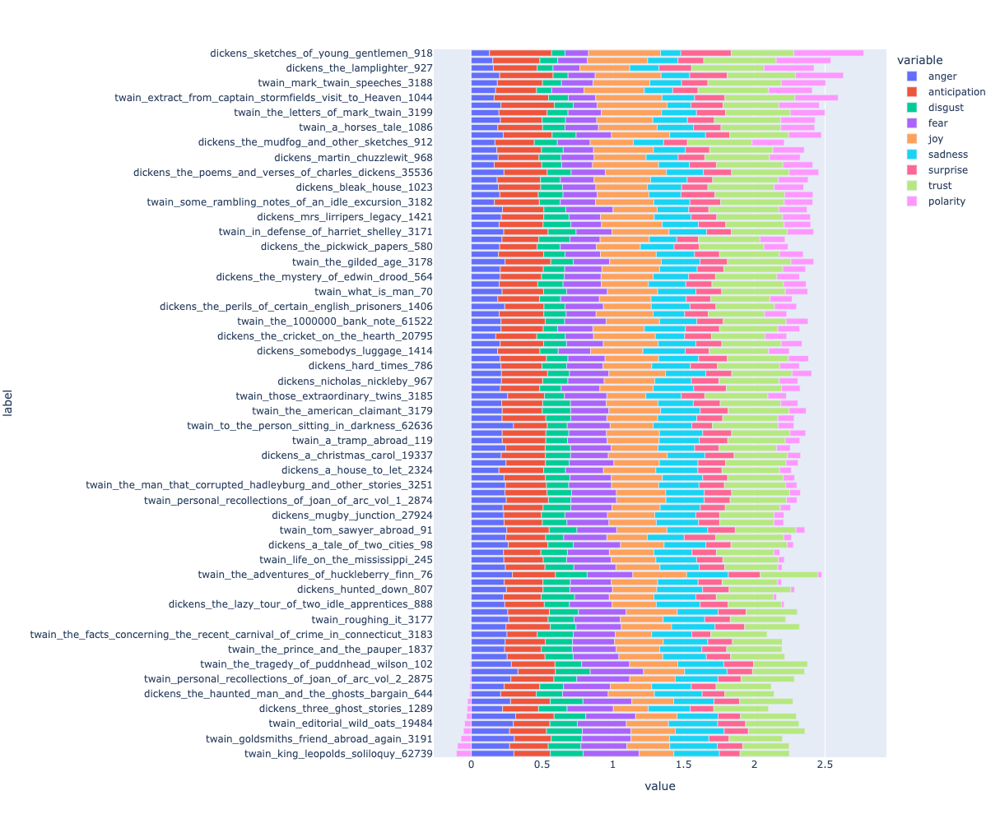

In [23]:
px.bar(books.reset_index().sort_values('polarity'), emo_cols, 'label', orientation='h', height=1000)

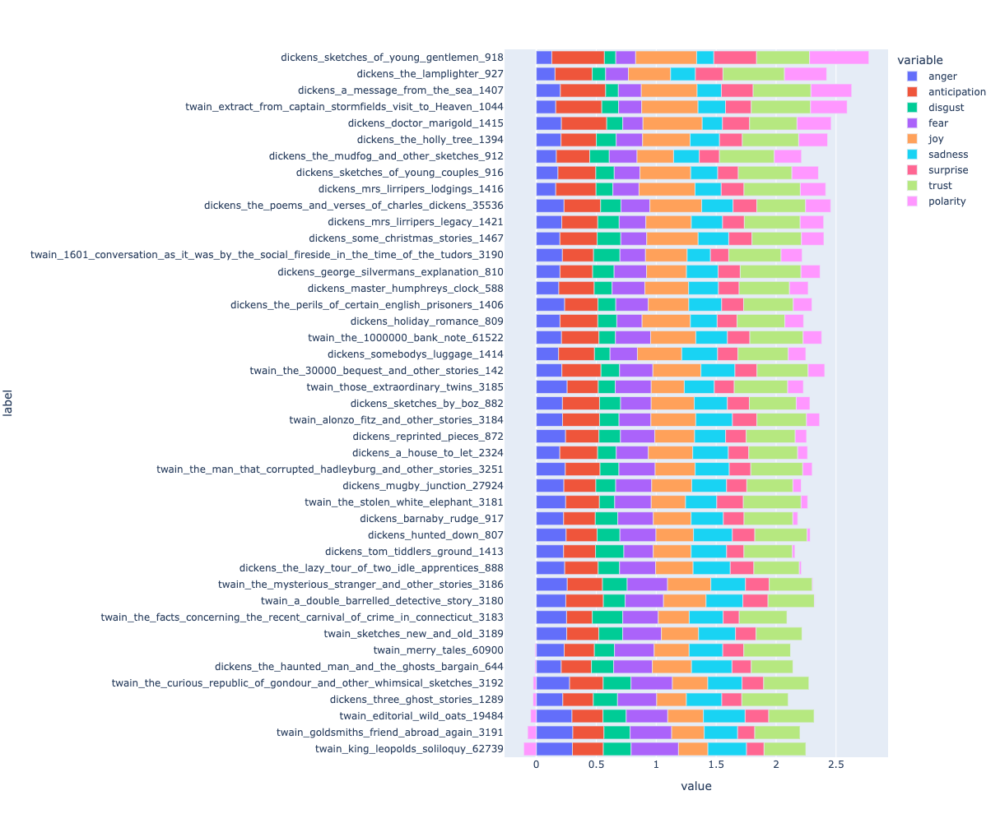

In [24]:
px.bar(books.loc[books.type == 'stories'].reset_index().sort_values('polarity'), emo_cols, 'label', orientation='h', height=1000)

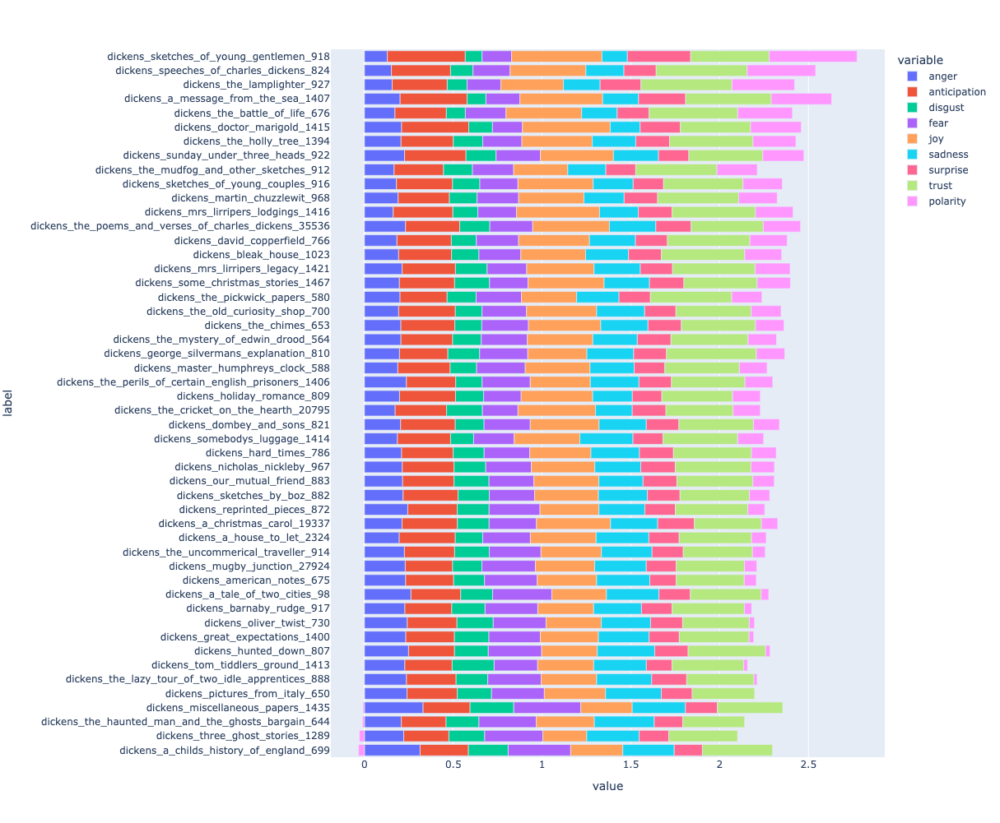

In [25]:
px.bar(books.loc[books.label.str.contains('dickens', case = False)].reset_index().sort_values('polarity'), emo_cols, 'label', orientation='h', height=1000)

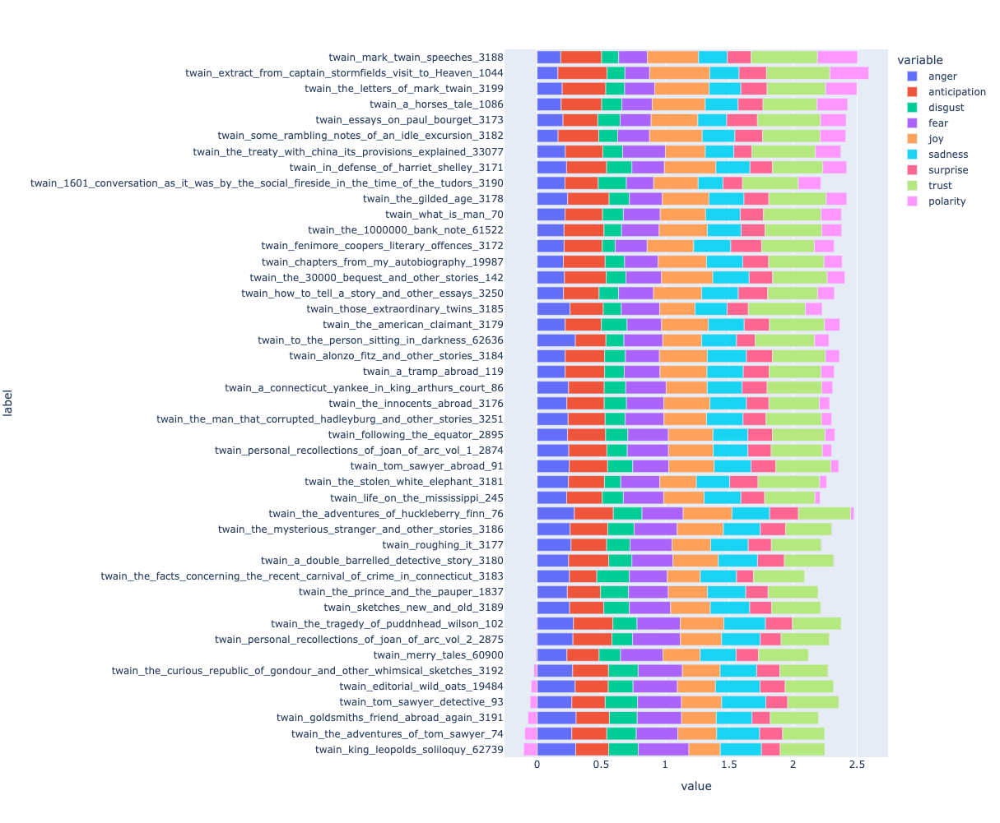

In [26]:
px.bar(books.loc[books.label.str.contains('twain', case = False)].reset_index().sort_values('polarity'), emo_cols, 'label', orientation='h', height=1000)

In [77]:
books.loc[books.polarity <= 0].shape[0] / books.shape[0]

0.17894736842105263

In [79]:
books.loc[books.polarity <= 0].type.value_counts()

stories        9
novel          4
non-fiction    4
Name: type, dtype: int64

In [86]:
# number of books with neutral / negative polarity by dickens
books.loc[(books.polarity <= 0) & (books.label.str.contains('dickens', case = False))].shape[0]

5

In [87]:
# number of books with neutral / negative polarity by twain
books.loc[(books.polarity <= 0) & (books.label.str.contains('twain', case = False))].shape[0]

12

## **Compare Novels**

### **Get Novels**

In [27]:
LIB.author.value_counts()

dickens    50
twain      45
Name: author, dtype: int64

In [28]:
dickens_books = LIB.loc[LIB.author == 'dickens'].index.values

twain_books = LIB.loc[LIB.author == 'twain'].index.values

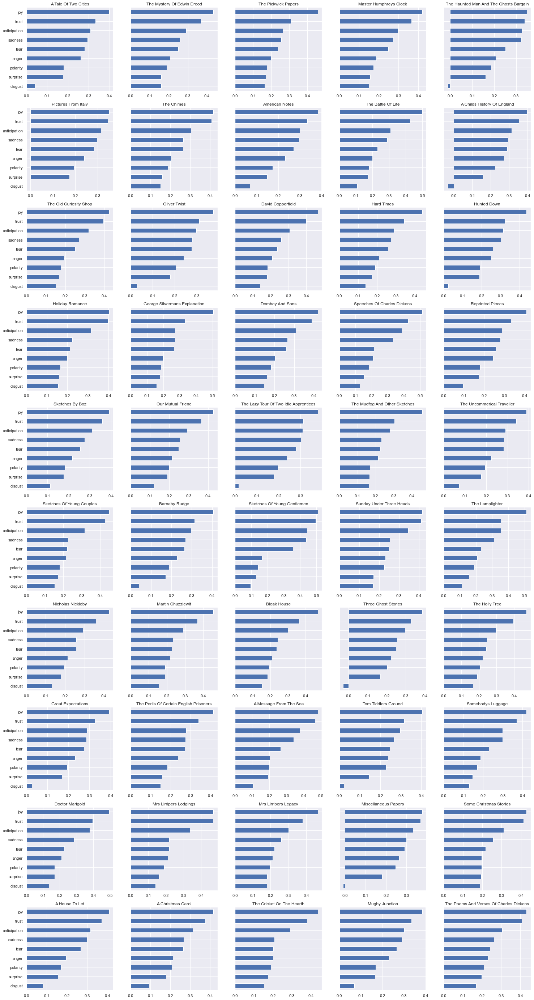

In [29]:
nrows = int(LIB.loc[LIB.author == 'dickens'].shape[0] / 5)
ncols = 5

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, sharey = True, figsize = (25, nrows * ncols))

for row in range(nrows):
    for col in range(ncols):
        index = ncols * row + col
        books.loc[dickens_books[index], emo_cols].sort_values().plot.barh(ax = axes[row, col], title = LIB.loc[dickens_books[index], "title"].title());

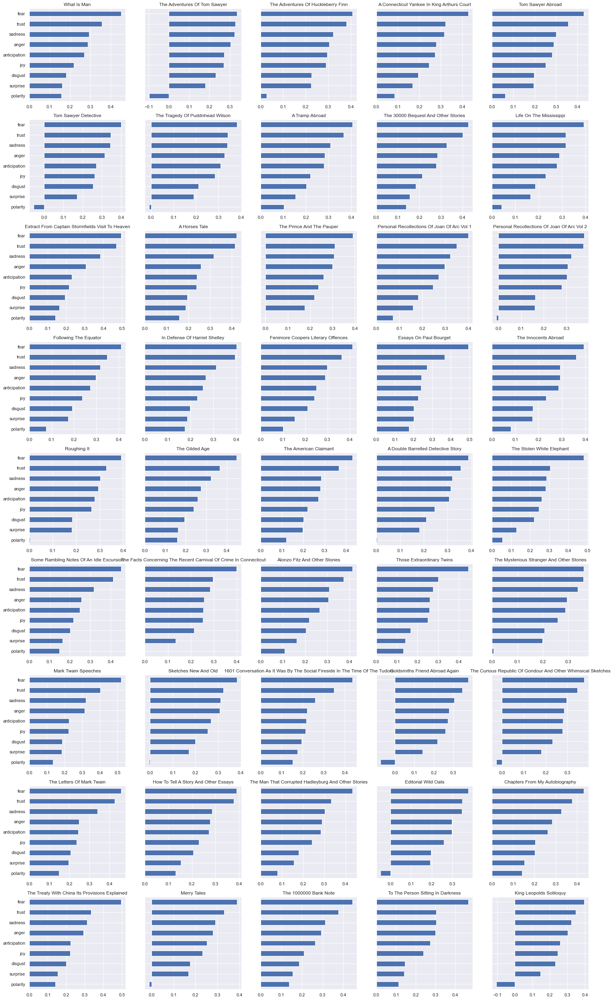

In [30]:
nrows = int(LIB.loc[LIB.author == 'twain'].shape[0] / 5)
ncols = 5

fig, axes = plt.subplots(nrows = nrows, ncols = ncols, sharey = True, figsize = (25, nrows * ncols))

for row in range(nrows):
    for col in range(ncols):
        index = ncols * row + col
        books.loc[twain_books[index], emo_cols].sort_values().plot.barh(ax = axes[row, col], title = LIB.loc[twain_books[index], "title"].title());

In [31]:
# Just for convenience
class Novels(): pass
novels = Novels()
for idx in LIB.index:
    label = LIB.loc[idx].label
    label = label.replace(' ', '_')
    label = label.replace('–','_')
    setattr(novels, label, idx)

### **`VOCAB` Table**

In [32]:
# dickens books
two_cities = novels.dickens_a_tale_of_two_cities_98
great_expectations = novels.dickens_great_expectations_1400
copperfield = novels.dickens_david_copperfield_766
twist = novels.dickens_oliver_twist_730
bleak = novels.dickens_bleak_house_1023
mutual = novels.dickens_our_mutual_friend_883

dickens_works = [(LIB.loc[two_cities, "title"], two_cities),
                 (LIB.loc[great_expectations, "title"], great_expectations),
                 (LIB.loc[copperfield, "title"], copperfield),
                 (LIB.loc[twist, "title"], twist),
                 (LIB.loc[bleak, "title"], bleak),
                 (LIB.loc[mutual, "title"], mutual)]

In [33]:
# twain books
rough = novels.twain_roughing_it_3177
gilded = novels.twain_the_gilded_age_3178
sawyer = novels.twain_the_adventures_of_tom_sawyer_74
huck = novels.twain_the_adventures_of_huckleberry_finn_76
yankee = novels.twain_a_connecticut_yankee_in_king_arthurs_court_86
puddnhead = novels.twain_the_tragedy_of_puddnhead_wilson_102

twain_works = [(LIB.loc[rough, "title"], rough),
               (LIB.loc[gilded, "title"], gilded),
               (LIB.loc[sawyer, "title"], sawyer),
               (LIB.loc[huck, "title"], huck),
               (LIB.loc[yankee, "title"], yankee),
               (LIB.loc[puddnhead, "title"], puddnhead)
]

## **Plot Sentiments**

In [34]:
def plot_sentiments(df, title, emo='polarity'):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, title = title)
    df[emo].plot(**FIG)

In [35]:
chaps_df = COMBO.groupby(OHCO[:2])[emo_cols].mean()

In [36]:
chaps_df = chaps_df.join(LIB)

In [37]:
chaps_df.head()

anger  anticipation   disgust      fear       joy  \
book_id chap_id                                                         
70      1        0.400000      0.600000  0.200000  0.400000  0.600000   
        2        0.208876      0.283432  0.174556  0.284615  0.357396   
        3        0.190647      0.320144  0.118705  0.287770  0.489209   
        4        0.248756      0.318408  0.199005  0.373134  0.278607   
        5        0.175115      0.308756  0.129032  0.221198  0.368664   

                  sadness  surprise     trust  polarity  \
book_id chap_id                                           
70      1        0.400000  0.600000  0.600000  0.200000   
        2        0.270414  0.146154  0.465680  0.146154   
        3        0.334532  0.233813  0.446043  0.212230   
        4        0.318408  0.208955  0.378109  0.084577   
        5        0.276498  0.239631  0.405530  0.142857   

                         source_file_path        title  \
book_id chap_id                                          
70      1        Twain/70-what_is_man.txt  what is man   
        2        Twain/70-what_is_man.txt  what is man   
        3        Twain/70-what_is_man.txt  what is man   
        4        Twain/70-what_is_man.txt  what is man   
        5        Twain/70-what_is_man.txt  what is man   

                                                        chap_regex author  \
book_id chap_id                                                             
70      1        WHAT IS MAN?|THE DEATH OF JEAN|THE TURNING-POI...  twain   
        2        WHAT IS MAN?|THE DEATH OF JEAN|THE TURNING-POI...  twain   
        3        WHAT IS MAN?|THE DEATH OF JEAN|THE TURNING-POI...  twain   
        4        WHAT IS MAN?|THE DEATH OF JEAN|THE TURNING-POI...  twain   
        5        WHAT IS MAN?|THE DEATH OF JEAN|THE TURNING-POI...  twain   

                        type  year  decade  n_chaps  book_len  \
book_id chap_id                                                 
70      1        non-fiction  1906    1900       17     96111   
        2        non-fiction  1906    1900       17     96111   
        3        non-fiction  1906    1900       17     96111   
        4        non-fiction  1906    1900       17     96111   
        5        non-fiction  1906    1900       17     96111   

                                label  
book_id chap_id                        
70      1        twain_what_is_man_70  
        2        twain_what_is_man_70  
        3        twain_what_is_man_70  
        4        twain_what_is_man_70  
        5        twain_what_is_man_70

### **Dickens Books**

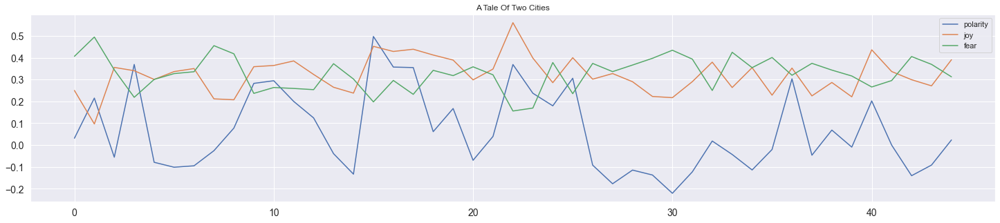

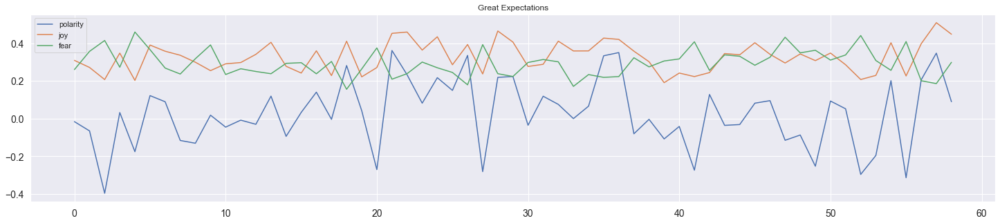

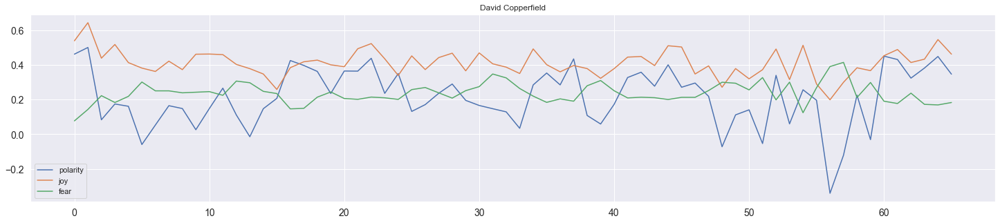

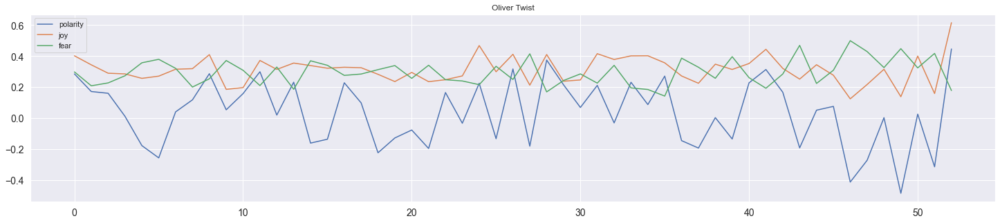

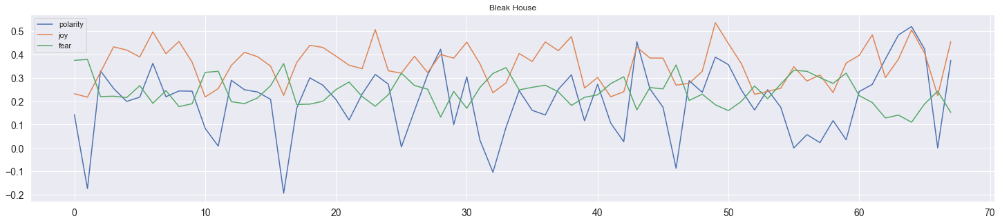

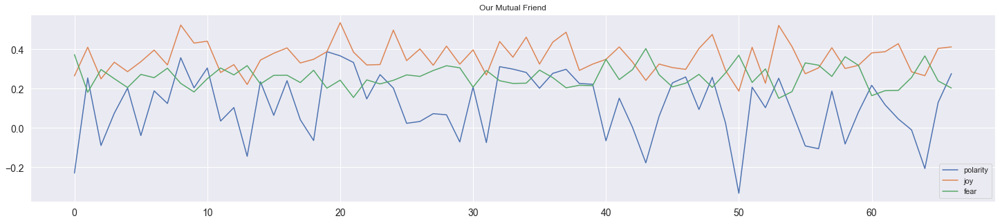

In [38]:
for col, book in enumerate(dickens_works):
    plot_sentiments(chaps_df.loc[book[1]].reset_index(), book[0].title(), ['polarity', 'joy', 'fear'])

### **Twain Books**

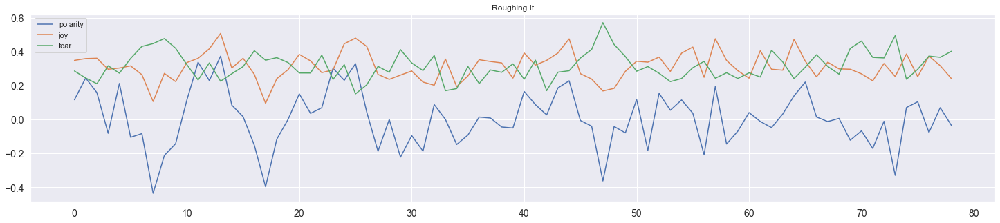

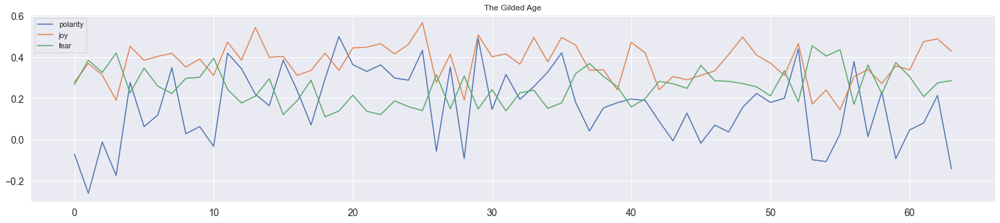

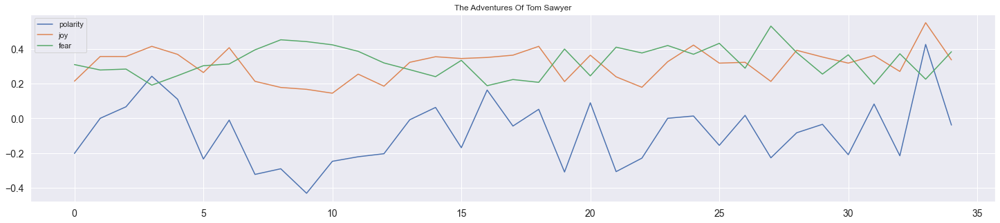

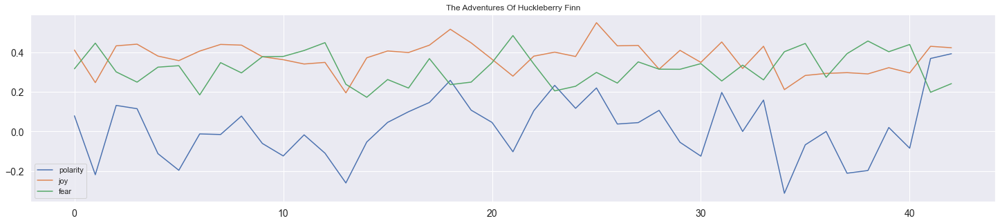

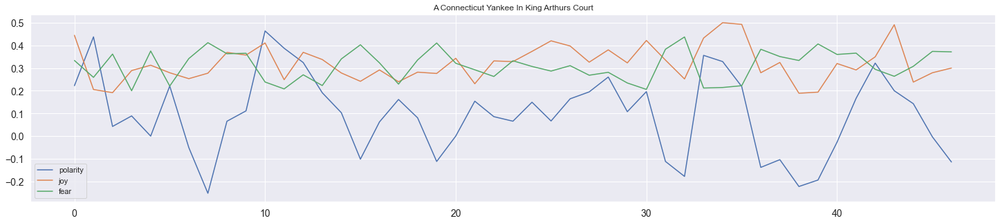

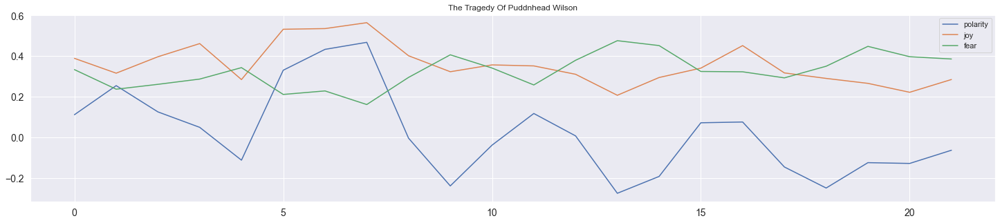

In [39]:
for col, book in enumerate(twain_works):
    plot_sentiments(chaps_df.loc[book[1]].reset_index(), book[0].title(), ['polarity', 'joy', 'fear'])

# Cose Read Sentiment in Texts

In [40]:
COMBO['html'] = COMBO.fillna(0).apply(lambda x: f"<spdan class='sent{int(np.sign(x['polarity']))}'>{x.term_str}</span>", 1)

In [41]:
COMBO.html.head()

book_id  chap_id  para_num  sent_num  token_num
70       1        1         0         0                   <spdan class='sent0'>by</span>
                                      1                 <spdan class='sent0'>mark</span>
                                      2                <spdan class='sent0'>twain</span>
                  2         0         0               <spdan class='sent0'>samuel</span>
                                      1            <spdan class='sent0'>langhorne</span>
Name: html, dtype: object

In [42]:
SENTENCES = COMBO.groupby(OHCO[:-1])[emo_cols].mean() #.term_str.count().to_frame('n').join(LIB).join(SALEX)

In [43]:
SENTENCES['html_str'] = COMBO.groupby(OHCO[:-1]).html.apply(lambda x: x.str.cat(sep=' '))

In [44]:
def sample_sentences(df, sample_size=10, emo='polarity'):

    rows = []
    sample = df.dropna().sample(sample_size).index    
    for idx in sample:
        valence = round(df.loc[idx, emo], 4)
        id_label = ' '.join([str(i) for i in idx]).upper()
        t = 0
        if valence > t: color = '#ccffcc'
        elif valence < t: color = '#ffcccc'
        else: color = '#f2f2f2'
        z = 0
        rows.append("""
        <tr style="background-color:{0};padding:.5rem 1rem;font-size:110%;">
            <td style="width:20%;">{1}</td>
            <td style="width:70%;">{2}</td>
            <td>{3}</td>
        </tr>
        """.format(color, id_label, df.loc[idx, 'html_str'], valence))   

    css = """
    #sample1 td {font-size:110%;vertical-align:top;text-align:left;} 
    #sample1 th {font-size:120%;vertical-align:top;text-align:left;} 
    .sent-1 {color:red;font-weight:bold;} 
    .sent1 {color:green;font-weight:bold;}
    """
    display(HTML(f'<style>{css}</style>'))
    display(HTML('<table id="sample1"><tr><th>Sentence</th><th>ID</th><th>Sentiment</th></tr>'+''.join(rows)+'</table>'))

In [45]:
sample_sentences(SENTENCES.loc[great_expectations])

Sentence,ID,Sentiment
11 123 1,he seemed to have no strength and he never once hit me hard and he was always knocked down but he would be up again in a moment sponging himself or drinking out of the water bottle with the greatest satisfaction in seconding himself according to form and then came at me with an air and a show that made me believe he really was going to do for me at last,0.0
40 54 2,i want to know how you are to be kept out of danger how long you are going to stay what projects you have,-1.0
45 6 1,the little servant happening to be entering the fortress with two hot rolls i passed through the postern and crossed the drawbridge in her company and so came without announcement into the presence of wemmick as he was making tea for himself and the aged,0.0
55 26 0,herbert was highly delighted when we shook hands on this arrangement and said he could now take courage to tell me that he believed he must go away at the end of the week,1.0
4 20 0,joes station and influence were something feebler if possible when there was company than when there was none,0.0
2 60 2,i had begun by asking questions and i was going to rob mrs joe,-1.0
2 22 1,after that he sat feeling his right side flaxen curls and whisker and following mrs joe about with his blue eyes as his manner always was at squally times,0.0
5 20 0,the interest of the impending pursuit not only absorbed the general attention but even made my sister liberal,0.3333
26 46 0,i told him i had come up again to say how sorry i was that anything disagreeable should have occurred and that i hoped he would not blame me much,-1.0
22 42 1,miss havisham you must know was a spoilt child,1.0


In [46]:
sample_sentences(SENTENCES.loc[bleak])

Sentence,ID,Sentiment
50 81 0,nothing could be more acceptable to the little circle than this call upon young woolwich who immediately fetches his fife and performs the stirring melody during which performance mr bucket much enlivened beats time and never fails to come in sharp with the burden british gra a anadeers,0.5
30 70 6,i have told your ladyship that i should be placed in a very disagreeable situation if any complaint was made and all is in strict confidence,0.0
37 72 4,might it not prove a little worse than she expected,-1.0
29 69 1,i hope your time is not so precious but that you will allow my lady and myself to offer you the hospitality of chesney wold for to night at least,1.0
14 118 1,all the love and duty i could ever have rendered to him is transferred to you,1.0
5 5 0,and mr jellyby sir,1.0
29 41 0,i am happy lady dedlock that you say so and i need not comment on the value to me of your kind opinion of her,1.0
14 26 1,said my guardian,1.0
46 94 4,thank you and god bless you in her name,1.0
15 99 0,he appears to be an excellent master i observed,1.0


In [47]:
sample_sentences(SENTENCES.loc[puddnhead])

Sentence,ID,Sentiment
4 26 0,deyll sell dese niggers to day fo stealin de money den deyll buy some mo dat dont know de chillen so dats all right,1.0
12 30 0,on the whole quite fairly said luigi,1.0
2 19 1,they fell away from him as from something uncanny and went into privacy to discuss him,-1.0
22 80 2,the percy driscoll estate was in such a crippled shape when its owner died that it could pay only sixty per cent,0.0
4 7 0,she put down the child and made the change,1.0
20 38 4,this charmed the doting mrs pratt who realized now as she had never done before she said what a sensitive and delicate nature her darling had and how he adored his poor uncle,0.5
14 59 1,but why cant she pawn it or sell it,-1.0
8 8 0,wilson had quickly chosen a position from which he could watch the girl without running much risk of being seen by her and he remained there hoping she would raise her veil and betray her face,-0.6667
22 13 6,this produced a strong sensation the last drowsy head in the court room roused up now and made preparation to listen,0.0
11 5 3,how hard the niggers fate seems this morning yet until last night such a thought never entered my head,-1.0


## **VADER**

In [48]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [49]:
analyser = SentimentIntensityAnalyzer()

In [50]:
SENTENCES['sent_str'] = COMBO.groupby(OHCO[:-1]).term_str.apply(lambda x: x.str.cat(sep=' '))
vader_cols = [f"vader_{col}" for col in "neg neu pos compound".split()]
SENTENCES[vader_cols] = SENTENCES.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))

In [51]:
SENTENCES.sample(10)

,,,,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity,html_str,sent_str,vader_neg,vader_neu,vader_pos,vader_compound
book_id,chap_id,para_num,sent_num,,,,,,,,,,,,,,,
968,25,150,1,0.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,-1.00,<spdan class='sent0'>theres</span> <spdan clas...,theres no harm in that i suppose,0.588,0.412,0.000,-0.6908
1400,3,32,0,0.000000,0.000000,0.0,1.000000,1.000000,0.000000,1.000000,0.000000,1.00,<spdan class='sent0'>the</span> <spdan class='...,the man stopped eating and regarded me with th...,0.086,0.498,0.416,0.8074
245,56,17,1,0.600000,0.400000,0.2,0.800000,0.000000,0.400000,0.400000,0.000000,-0.60,<spdan class='sent0'>wherever</span> <spdan cl...,wherever in the uttermost parts of the globe a...,0.041,0.959,0.000,-0.2960
3176,26,5,6,0.222222,0.444444,0.0,0.444444,0.222222,0.333333,0.111111,0.444444,0.00,<spdan class='sent0'>they</span> <spdan class=...,they can work at any business they please they...,0.040,0.874,0.086,0.8126
1023,52,47,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<spdan class='sent0'>and</span> <spdan class='...,and it really was,0.000,1.000,0.000,0.0000
564,17,142,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<spdan class='sent0'>where</span> <spdan class...,where are you going mr tartar,0.000,1.000,0.000,0.0000
580,25,6,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<spdan class='sent0'>business</span> <spdan cl...,business first pleasure arterwards as king ric...,0.163,0.712,0.125,-0.0258
882,54,159,7,0.250000,0.500000,0.0,0.750000,0.000000,0.250000,0.000000,0.250000,-0.25,<spdan class='sent0'>and</span> <spdan class='...,and horace hunter took great credit to himself...,0.037,0.756,0.207,0.8779
61522,3,132,3,1.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.500000,0.000000,0.00,<spdan class='sent0'>you</span> <spdan class='...,you walk carelessly towards the academy grove ...,0.056,0.864,0.081,0.2263


In [52]:
def vader_plot(novel_name):
    global SENTENCES
    X = SENTENCES.loc[novel_name]
    w = int(len(X)/5)
    fig, axes = plt.subplots(ncols=1, nrows=3, figsize=(25,20), sharex=True)
    X[['vader_pos','vader_neg']].rolling(w).mean().plot(ax=axes[0], title=f'{LIB.loc[novel_name, "title"].title()} {novel_name}\npos, neg {w}');
    X['vader_neu'].rolling(w).mean().plot(ax=axes[1], title=f'{LIB.loc[novel_name, "title"].title()} {novel_name}\nneu');
    X['vader_compound'].rolling(w).mean().plot(ax=axes[2], title=f'{LIB.loc[novel_name, "title"].title()} {novel_name}\ncompound');

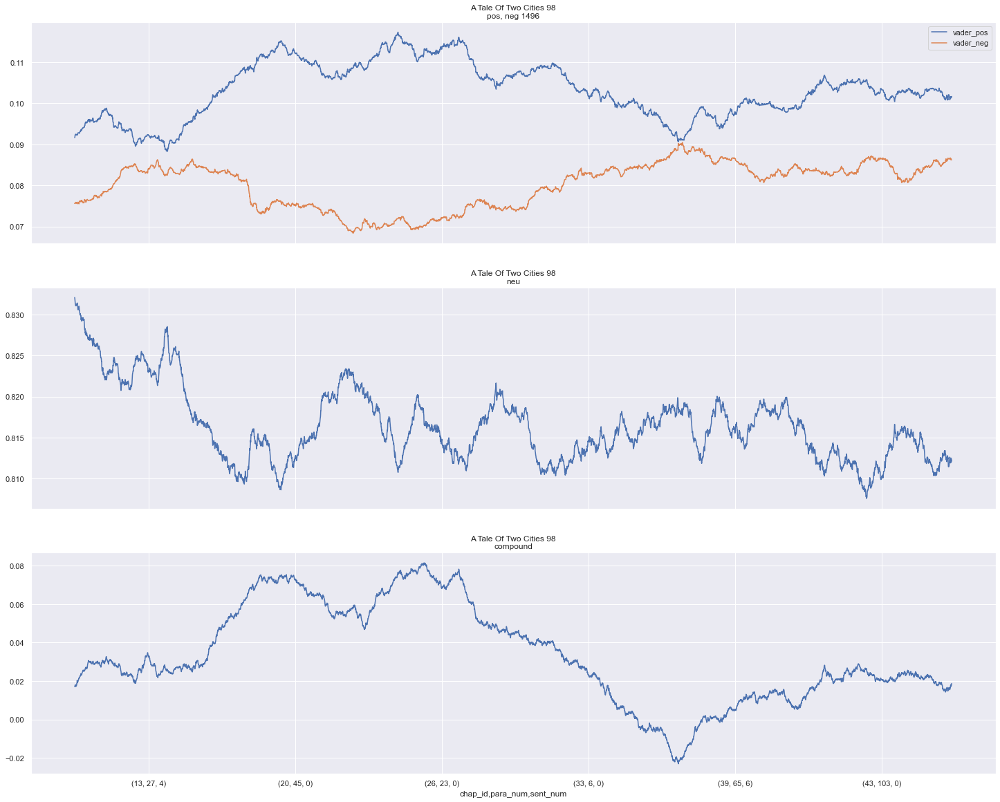

In [53]:
vader_plot(two_cities)

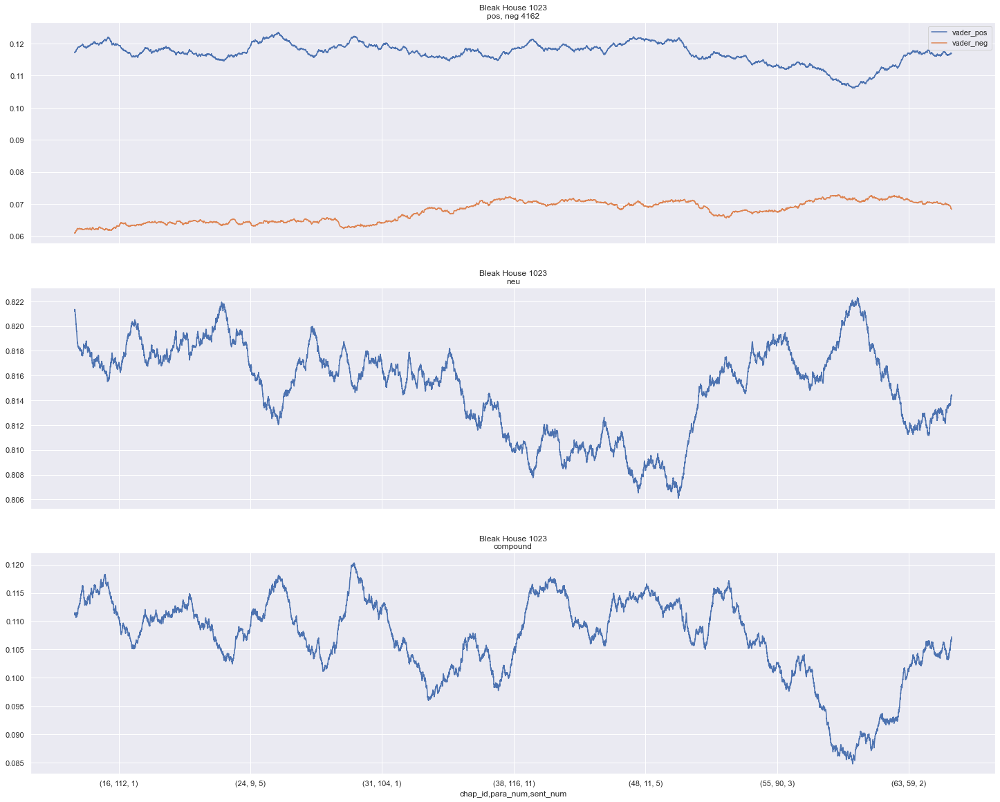

In [54]:
vader_plot(bleak)

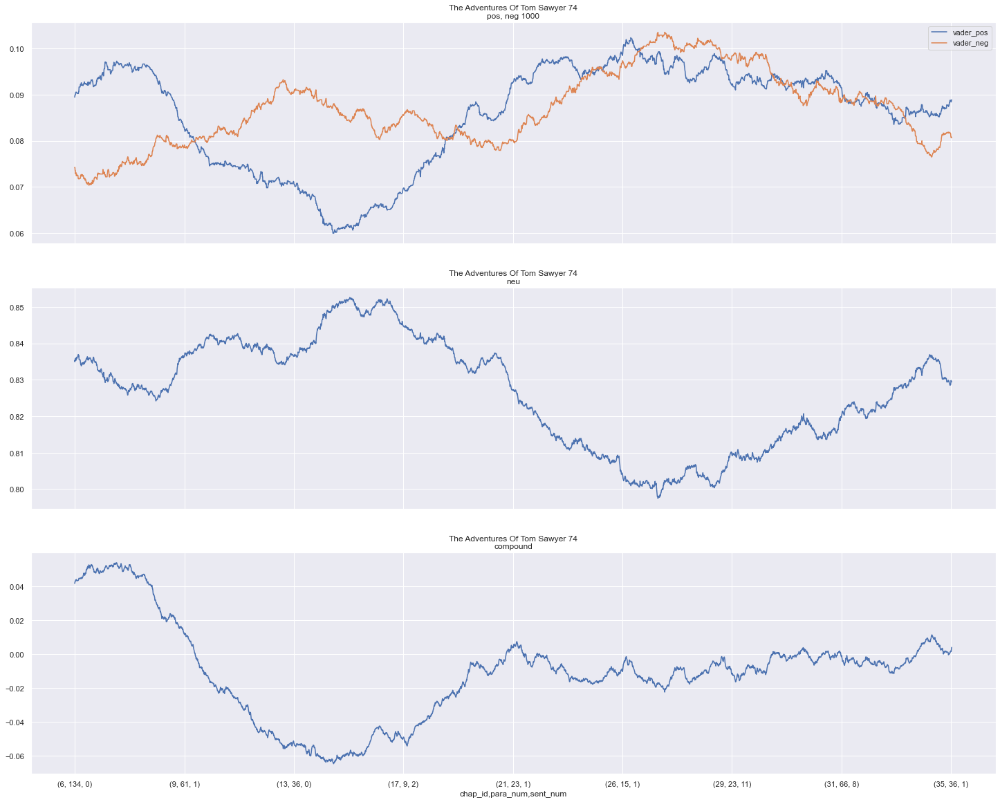

In [55]:
vader_plot(sawyer)

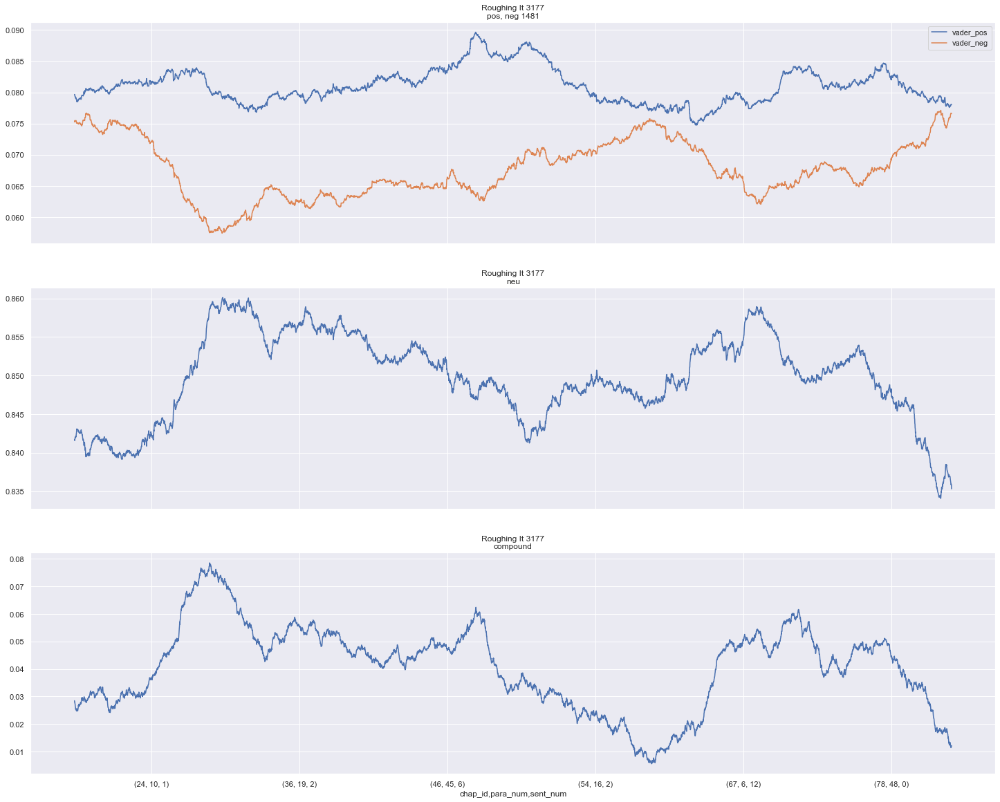

In [56]:
vader_plot(rough)

## **Compare Novels**

In [57]:
FIG = dict(figsize=(12, 5), legend=True, fontsize=14, rot=45)

In [58]:
def compare_novels(novel_a, novel_b, w=10, emo='vader_compound'):
    global SENTENCES, FIG
    
    A = SENTENCES.loc[novel_a].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    A['cut'] = pd.cut(A.seq, 100)
    A1 = A.groupby('cut')[emo].mean().reset_index(drop=True)

    B = SENTENCES.loc[novel_b].reset_index(drop=True).reset_index().rename(columns=dict(index='seq'))
    B['cut'] = pd.cut(B.seq, 100)
    B1 = B.groupby('cut')[emo].mean().reset_index(drop=True)

    C = pd.concat([A1,B1], axis=1)
    C.columns = [novel_a, novel_b]

    plt = C.rolling(w).mean().plot(**FIG)
    plt.set_title(f'{LIB.loc[novel_a, "title"].title()} ({novel_a}) by {LIB.loc[novel_a, "author"].title()} vs. {LIB.loc[novel_b, "title"].title()} by {LIB.loc[novel_b, "author"].title()} ({novel_b})',
                  fontsize = 14);

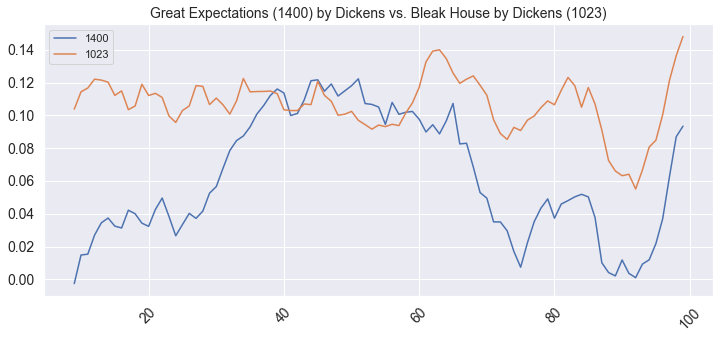

In [59]:
compare_novels(great_expectations, bleak)

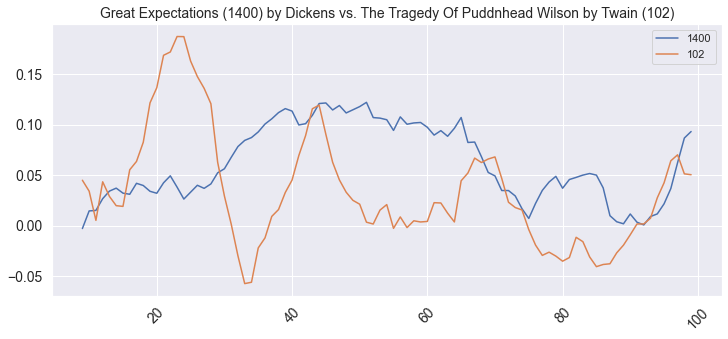

In [60]:
compare_novels(great_expectations, puddnhead)

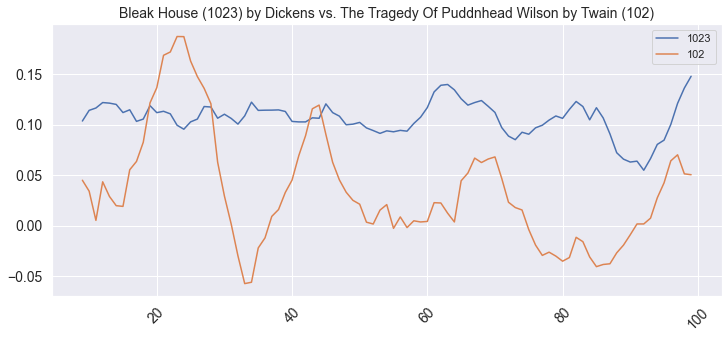

In [61]:
compare_novels(bleak, puddnhead)

In [63]:
# additional dickens novels for comparison
haunted = novels.dickens_the_haunted_man_and_the_ghosts_bargain_644
martin = novels.dickens_martin_chuzzlewit_968
curious = novels.dickens_the_old_curiosity_shop_700
dombey = novels.dickens_dombey_and_sons_821
# travel books
american_notes = novels.dickens_american_notes_675
italy = novels.dickens_pictures_from_italy_650
traveller = novels.dickens_the_uncommerical_traveller_914


# additional twain novels for comparison
carnival = novels.twain_the_facts_concerning_the_recent_carnival_of_crime_in_connecticut_3183
pauper = novels.twain_the_prince_and_the_pauper_1837
# travel books
claimant = novels.twain_the_american_claimant_3179
innocents = novels.twain_the_innocents_abroad_3176
tramp = novels.twain_a_tramp_abroad_119
equator = novels.twain_following_the_equator_2895
miss = novels.twain_life_on_the_mississippi_245

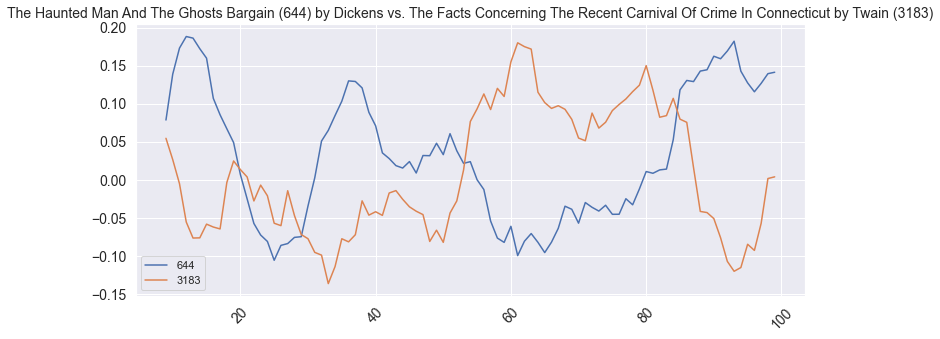

In [64]:
compare_novels(haunted, carnival) # eerier stories (??)

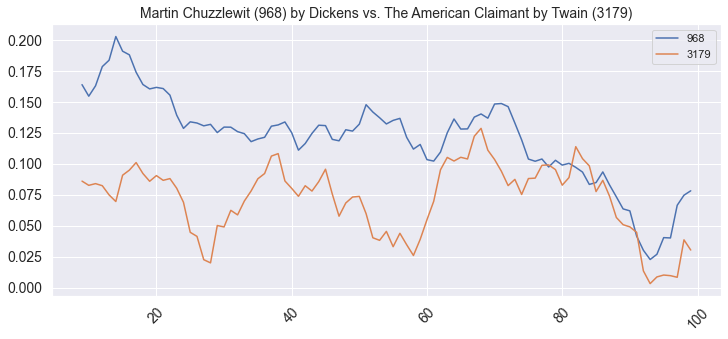

In [65]:
compare_novels(martin, claimant) # books about america

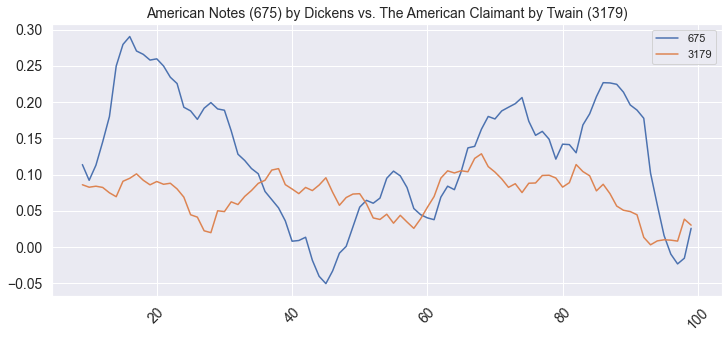

In [66]:
compare_novels(american_notes, claimant) # books about america

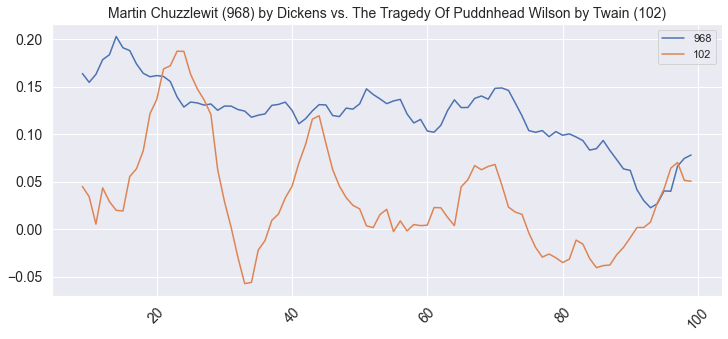

In [90]:
compare_novels(martin, puddnhead) # books about america

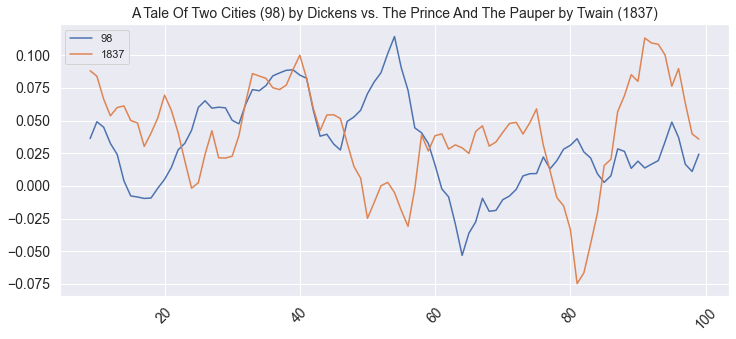

In [67]:
compare_novels(two_cities, pauper) # twins

#### **Books with Young Protagonists**

In [68]:
# books involving young protagonists

dickens_compare = [great_expectations, twist, curious, copperfield, dombey]

twain_compare = [sawyer, huck]

novel_pairs = [i for i in itertools.combinations(dickens_compare + twain_compare, 2) if i[0] in dickens_compare and i[1] in twain_compare]

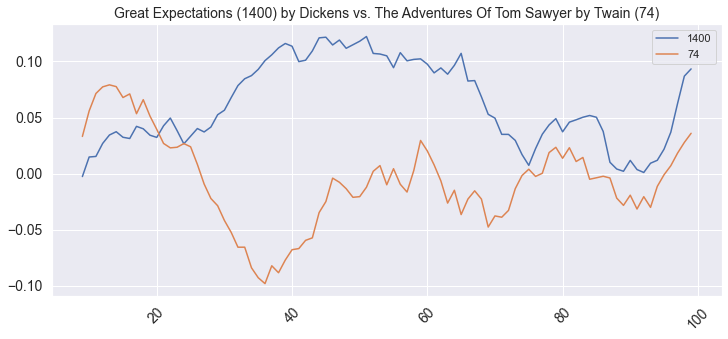

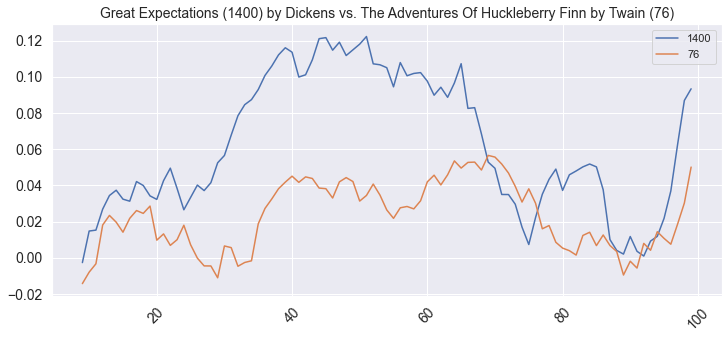

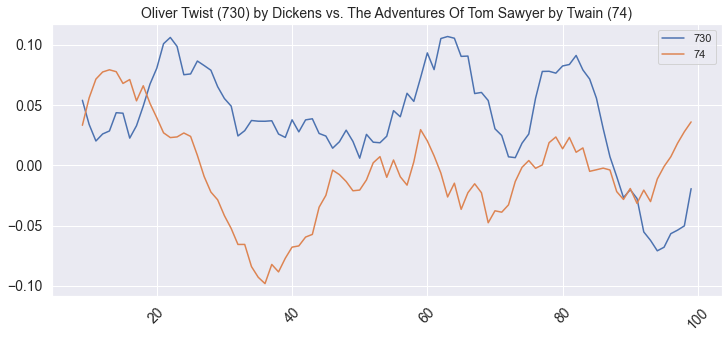

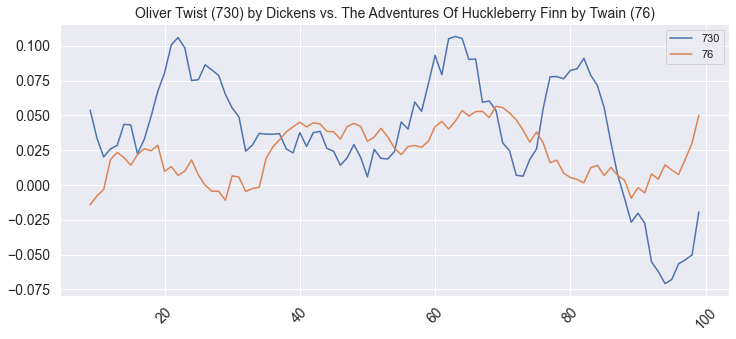

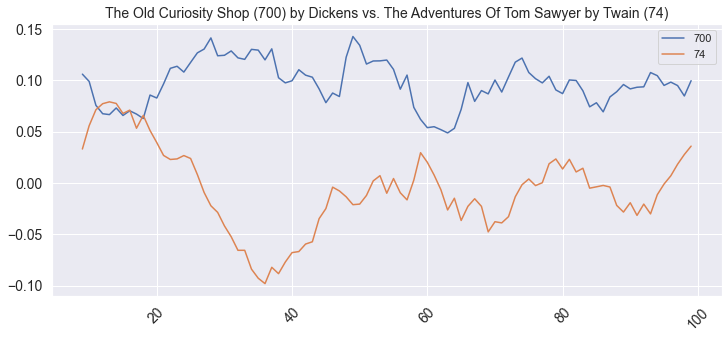

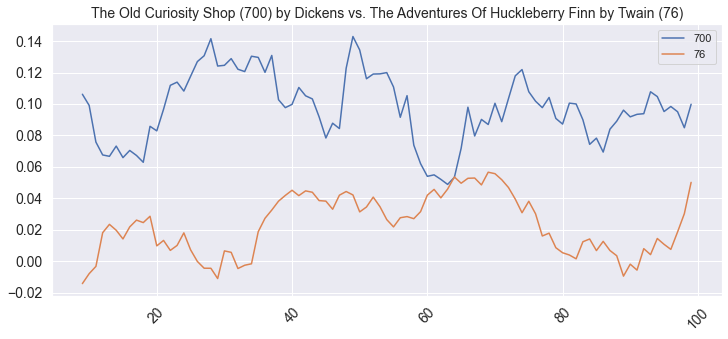

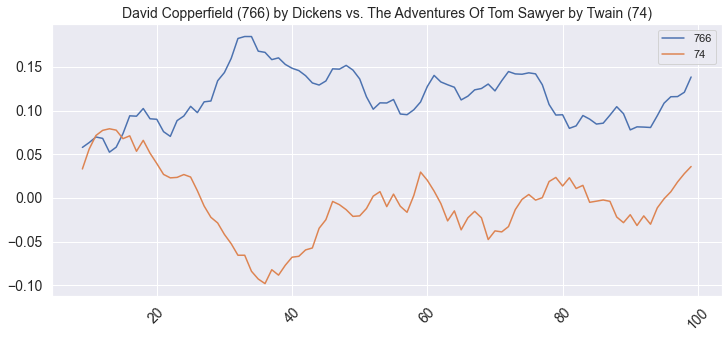

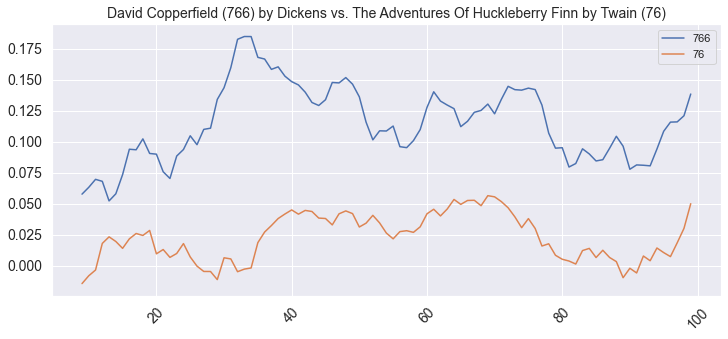

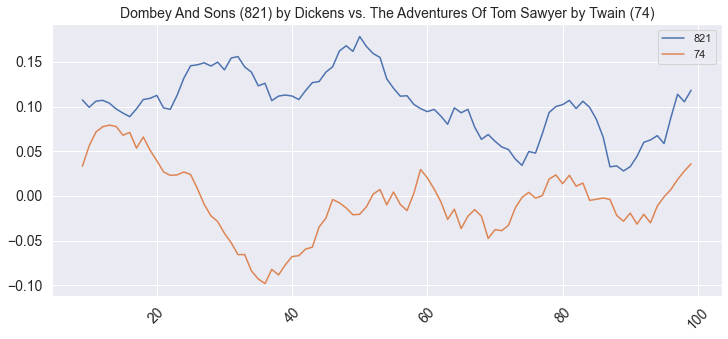

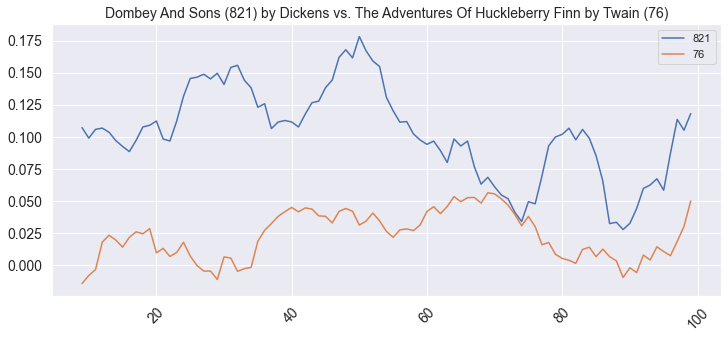

In [69]:
for pair in novel_pairs:
    compare_novels(pair[0], pair[1])

#### **Travel Stories**

In [70]:
dickens_travel = [traveller, american_notes, italy]

twain_travel = [rough, claimant, innocents, tramp, equator, miss]

travel_pairs = [i for i in itertools.combinations(dickens_travel + twain_travel, 2) if i[0] in dickens_travel and i[1] in twain_travel]

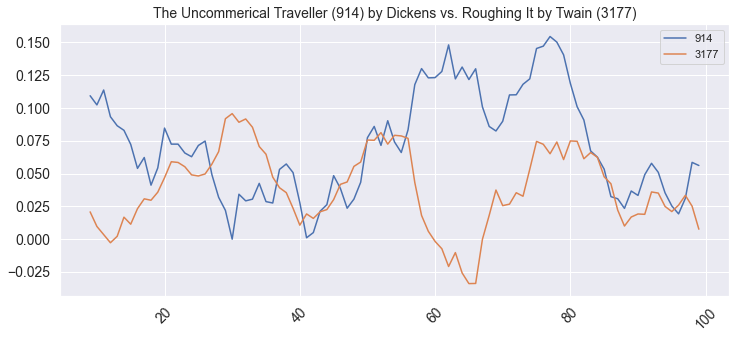

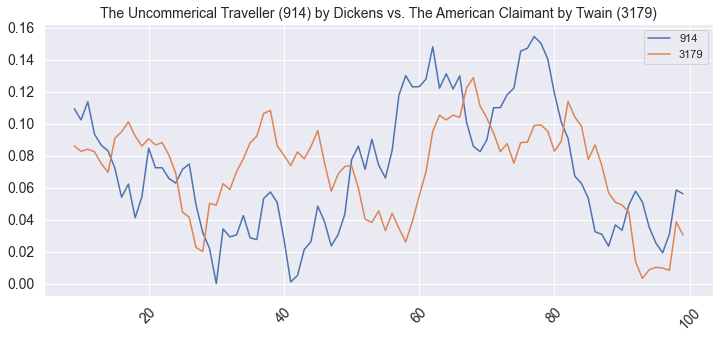

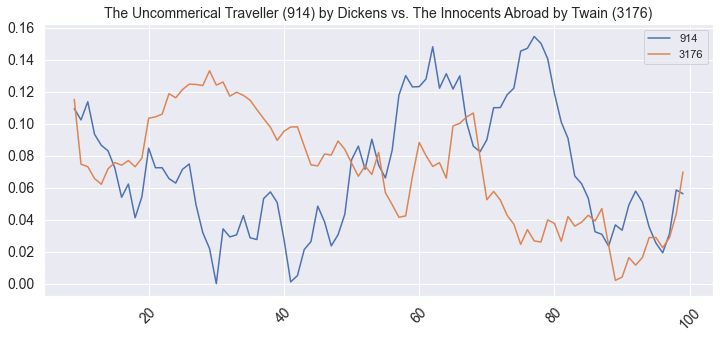

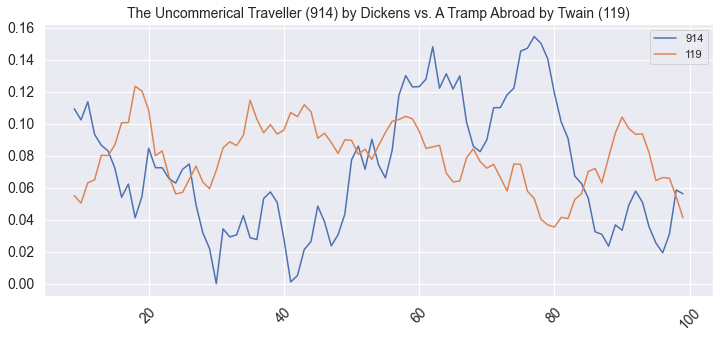

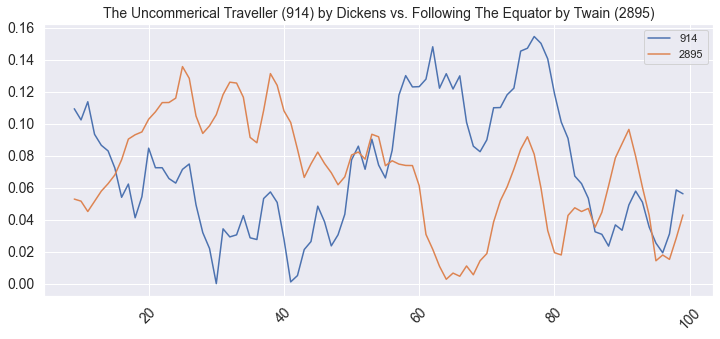

...

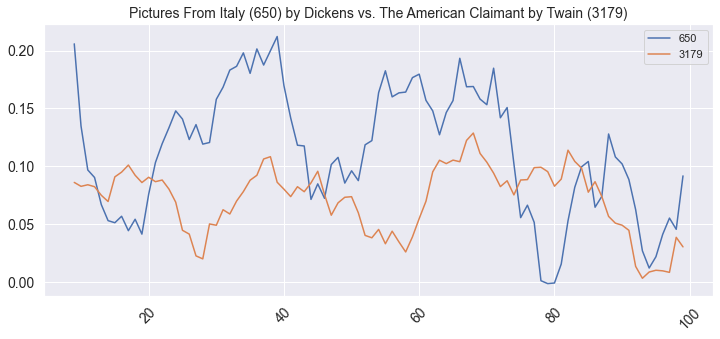

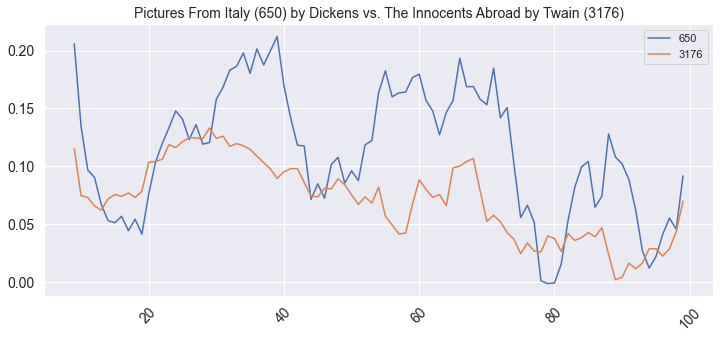

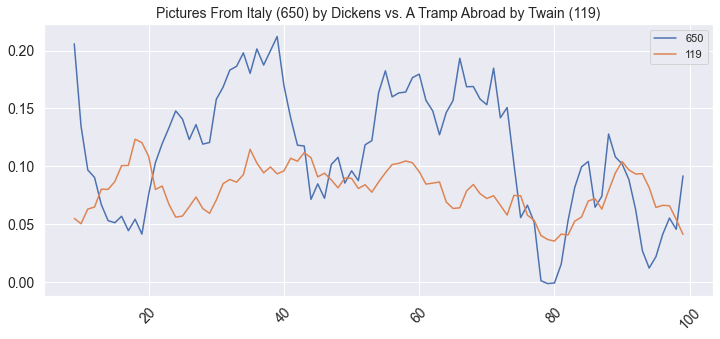

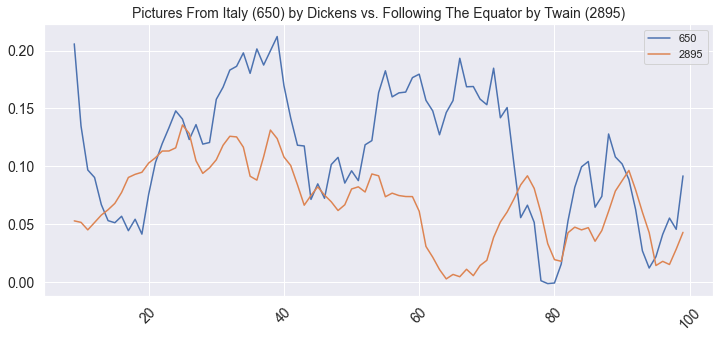

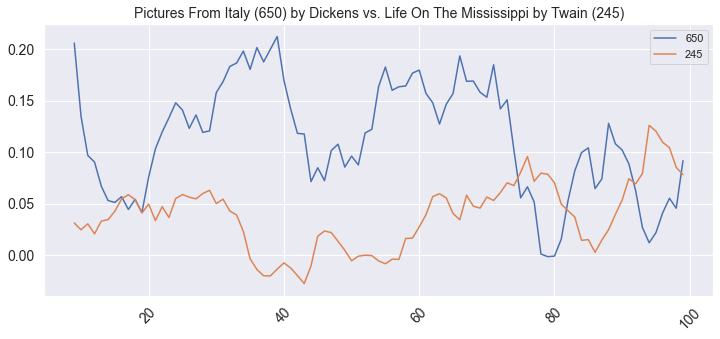

In [71]:
for pair in travel_pairs:
    compare_novels(pair[0], pair[1])

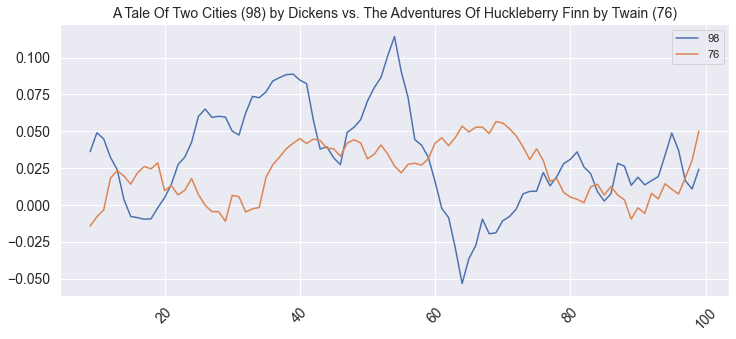

In [72]:
compare_novels(two_cities, huck)

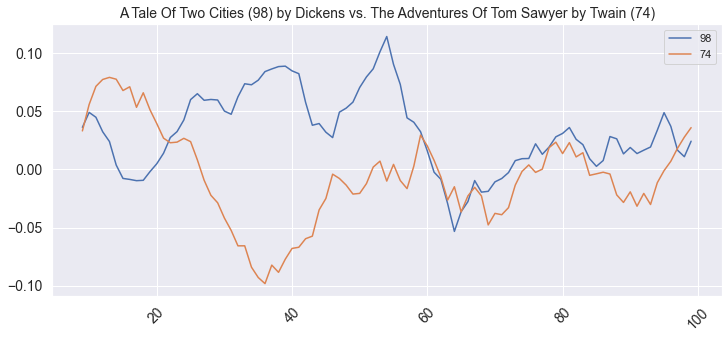

In [73]:
compare_novels(two_cities, sawyer)

In [74]:
LIB.to_csv('full_LIB.csv')

CORPUS.to_csv('full_CORPUS.csv')

In [96]:
COMBO.to_csv('full_COMBO.csv')
books.to_csv('full_books.csv')

In [97]:
SENTENCES.to_csv('full_SENT_SENTIMENT.csv')

In [103]:
vocab_sentiment.to_csv('full_vocab_sentiment.csv')

#### **Sources**

* `M10_04_AustenMelville.ipynb` by Professor Raf Alvarado
* Sentiment analysis using `VADER` in `nltk`: https://towardsdatascience.com/sentimental-analysis-using-vader-a3415fef7664
* How to fix matplotlib `.title()` TypeError: ‘Text’ object is not callable with `.set_title()`: https://techoverflow.net/2021/04/04/how-to-fix-matplotlib-title-typeerror-text-object-is-not-callable/
* Géron, Aurélien, *Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow: Concepts, Tools, and Techniques to Build Intelligent Systems* (O'Reilly Media, 2019) (for plotting images)